In [1]:
using Pkg

In [2]:
Pkg.add("ScikitLearn")
Pkg.add("DataFrames")
Pkg.add("CSV")
Pkg.add("PyCall")
Pkg.add("GaussianMixtures")
Pkg.add("Clustering")
Pkg.add("Plots")
Pkg.add("Distances")
Pkg.add("Statistics")
Pkg.add("LinearAlgebra")

   Updating registry at `C:\Users\conno\.julia\registries\General`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environments\v1.5\Project.toml`
No Changes to `C:\Users\conno\.julia\environments\v1.5\Manifest.toml`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environments\v1.5\Project.toml`
No Changes to `C:\Users\conno\.julia\environments\v1.5\Manifest.toml`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environments\v1.5\Project.toml`
No Changes to `C:\Users\conno\.julia\environments\v1.5\Manifest.toml`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environments\v1.5\Project.toml`
No Changes to `C:\Users\conno\.julia\environments\v1.5\Manifest.toml`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environments\v1.5\Project.toml`
No Changes to `C:\Users\conno\.julia\environments\v1.5\Manifest.toml`
  Resolving package versions...
No Changes to `C:\Users\conno\.julia\environme

In [3]:
using ScikitLearn
using DataFrames
using CSV
using PyCall
using GaussianMixtures
using Clustering
using Plots
using Distances
using Statistics
using LinearAlgebra

In [4]:
@sk_import preprocessing: OneHotEncoder;
@sk_import preprocessing: LabelEncoder;
@sk_import decomposition: PCA;
@sk_import manifold: TSNE;

## Importing data

In [5]:
df_label = CSV.File("01_hdp.csv"; header = true) |> DataFrame;

In [6]:
X_label = convert(Array, df_label);

## Categorical to numerical data using label encoding

In [7]:
label_encoder = LabelEncoder();
label_encoded1 = label_encoder.fit_transform(X_label[:, 12]);
label_encoded2 = label_encoder.fit_transform(X_label[:, 13]);
label_encoded3 = label_encoder.fit_transform(X_label[:, 14]);
label_encoded4 = label_encoder.fit_transform(X_label[:, 15]);
label_encoded5 = label_encoder.fit_transform(X_label[:, 24]);

In [8]:
df_label.FamilyHx = label_encoded1;
df_label.SmokingHx = label_encoded2;
df_label.Sex = label_encoded3;
df_label.CancerStage = label_encoded4;
df_label.School = label_encoded5;

In [9]:
X_label = convert(Array, df_label);

## Scaling the data between 0-1

In [10]:
# This could be used for normalization instead of scaling
# for i = 1:1:size(X_label)[2]
#     X_label[:, i] = normalize(X_label[:, i]);
# end

In [11]:
for i = 1:1:size(X_label)[2]
    X_label[:,i] = X_label[:,i]./findmax(X_label[:,i])[1];
end

## PCA to determine most important features for plotting

In [12]:
pca = PCA(n_components=2);
X_pca = pca.fit_transform(X_label);
df_pca_label = X_pca |> DataFrame;

In [13]:
tse = TSNE(n_components=2);
X_tse = tse.fit_transform(X_label);
df_tsne_label = X_tse |> DataFrame;

## K-means

In [14]:
features = collect(Matrix(X_label)');

clusters = 0;
max = 0.0;
for i = 5:1:40
    result_kmeans = kmeans(features, i);
    a = assignments(result_kmeans);
    c = counts(result_kmeans);
    distances = pairwise(SqEuclidean(), X_label');
    score = mean(silhouettes(a, c, distances));
        
    println("Mean Silhouettes Score with ", i, " clusters (Closer to 1 is better): ", score);
    
    if score > max
        max = score
        clusters = i;
    end
end
println()
println("Highest Mean Silhouettes Score with ", clusters, " clusters (Closer to 1 is better): ", max);

k_means_time = @elapsed begin
result_kmeans = kmeans(features, clusters);
end;

Mean Silhouettes Score with 5 clusters (Closer to 1 is better): 0.20140660917536946
Mean Silhouettes Score with 6 clusters (Closer to 1 is better): 0.1963908744303777
Mean Silhouettes Score with 7 clusters (Closer to 1 is better): 0.22573688844340403
Mean Silhouettes Score with 8 clusters (Closer to 1 is better): 0.2540648743706855
Mean Silhouettes Score with 9 clusters (Closer to 1 is better): 0.21684637427258854
Mean Silhouettes Score with 10 clusters (Closer to 1 is better): 0.2654081683408817
Mean Silhouettes Score with 11 clusters (Closer to 1 is better): 0.24812920353430915
Mean Silhouettes Score with 12 clusters (Closer to 1 is better): 0.22568802017155587
Mean Silhouettes Score with 13 clusters (Closer to 1 is better): 0.2658310237235597
Mean Silhouettes Score with 14 clusters (Closer to 1 is better): 0.2804559871874733
Mean Silhouettes Score with 15 clusters (Closer to 1 is better): 0.2777388624144917
Mean Silhouettes Score with 16 clusters (Closer to 1 is better): 0.271805207

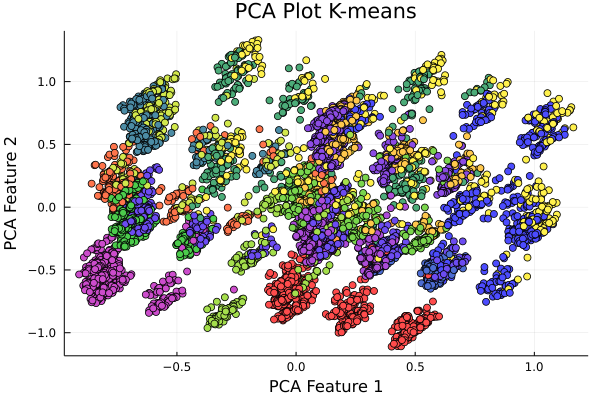

In [15]:
scatter(df_pca_label.x1, df_pca_label.x2, marker_z=result_kmeans.assignments, title = "PCA Plot K-means", color=:lightrainbow, legend=false)
xlabel!("PCA Feature 1")
ylabel!("PCA Feature 2")

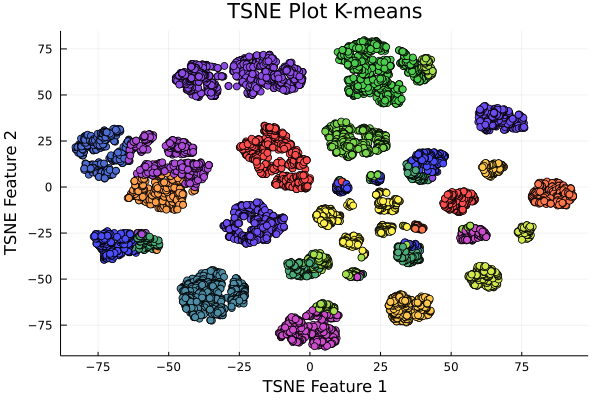

In [16]:
scatter(df_tsne_label.x1, df_tsne_label.x2, marker_z=result_kmeans.assignments, title = "TSNE Plot K-means", color=:lightrainbow, legend=false)
xlabel!("TSNE Feature 1")
ylabel!("TSNE Feature 2")

In [17]:
println("Time: ", k_means_time, "s");

Time: 0.053673899s


In [18]:
a = assignments(result_kmeans);
c = counts(result_kmeans);
println("Total Cost: ", result_kmeans.totalcost);

Total Cost: 7553.108819993943


In [19]:
distances = pairwise(SqEuclidean(), X_label');
println("Mean Silhouettes Score (Closer to 1 is better): ", mean(silhouettes(a, c, distances)));

Mean Silhouettes Score (Closer to 1 is better): 0.238459364503935


In [20]:
sils = silhouettes(a, c, distances)
out_3_vals_kmeans = sort(sils)[[1,2,3]];
out_3_ind_kmeans = [];
for i = 1:1:3
    temp = findall(x->x==out_3_vals_kmeans[i], sils)
    append!(out_3_ind_kmeans, temp);
end
println("The top three outliers are rows: ", out_3_ind_kmeans[1]," ",out_3_ind_kmeans[2]," ",out_3_ind_kmeans[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_kmeans][1]," ",a[out_3_ind_kmeans][1], " ",a[out_3_ind_kmeans][3],  " respectively");

The top three outliers are rows: 3040 6410 4543 in the excel file
They are part of clusters: 8 8 8 respectively


In [21]:
println("The outlier data in the corresponding rows") 
show(df_label[out_3_ind_kmeans, :])
println() 

The outlier data in the corresponding rows
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   64.0985  1.54962      6      6         4        3          0          ⋯
   2 │   52.8627  1.60821      5      7         6        2          3
   3 │   57.0972  1.57217      4      6         4        2          0
                                                              20 columns omitted


## K-medoids

In [22]:
R = pairwise(SqEuclidean(),X_label, dims=1);
features = collect(Matrix(R)');

clusters = 0;
max = 0.0;
for i = 5:1:40
    result_kmedoids = kmedoids(features, i);
    a = assignments(result_kmedoids);
    c = counts(result_kmedoids);
    distances = pairwise(SqEuclidean(), X_label');
    score = mean(silhouettes(a, c, distances));
        
    println("Mean Silhouettes Score with ", i, " clusters (Closer to 1 is better): ", score);
    
    if score > max
        max = score
        clusters = i;
    end
end
println()
println("Highest Mean Silhouettes Score with ", clusters, " clusters (Closer to 1 is better): ", max);

k_medoids_time = @elapsed begin
result_kmedoids = kmedoids(features, clusters);
end;

Mean Silhouettes Score with 5 clusters (Closer to 1 is better): 0.14989877088563594
Mean Silhouettes Score with 6 clusters (Closer to 1 is better): 0.18250245830533277
Mean Silhouettes Score with 7 clusters (Closer to 1 is better): 0.20646580493761438
Mean Silhouettes Score with 8 clusters (Closer to 1 is better): 0.17496487105932018
Mean Silhouettes Score with 9 clusters (Closer to 1 is better): 0.17156678820138435
Mean Silhouettes Score with 10 clusters (Closer to 1 is better): 0.1786246172007333
Mean Silhouettes Score with 11 clusters (Closer to 1 is better): 0.1792702713331086
Mean Silhouettes Score with 12 clusters (Closer to 1 is better): 0.2248366981711736
Mean Silhouettes Score with 13 clusters (Closer to 1 is better): 0.17740466821912643
Mean Silhouettes Score with 14 clusters (Closer to 1 is better): 0.16068997217568
Mean Silhouettes Score with 15 clusters (Closer to 1 is better): 0.18472631272774645
Mean Silhouettes Score with 16 clusters (Closer to 1 is better): 0.166243621

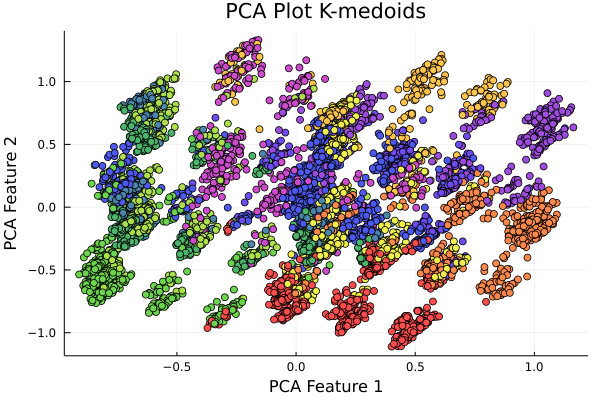

In [23]:
scatter( df_pca_label.x1, df_pca_label.x2, marker_z=result_kmedoids.assignments, title = "PCA Plot K-medoids", color=:lightrainbow, legend=false)
xlabel!("PCA Feature 1")
ylabel!("PCA Feature 2")

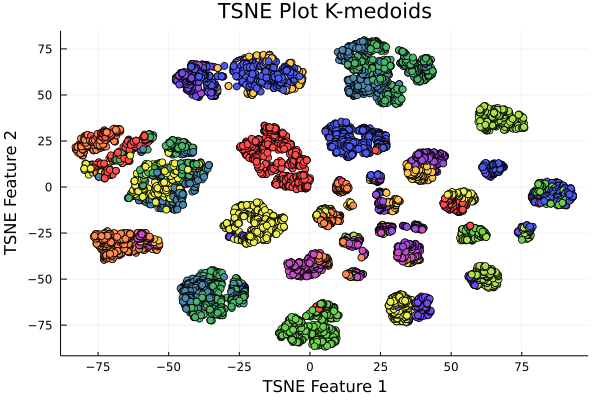

In [24]:
scatter(df_tsne_label.x1, df_tsne_label.x2, marker_z=result_kmedoids.assignments, title = "TSNE Plot K-medoids", color=:lightrainbow, legend=false)
xlabel!("TSNE Feature 1")
ylabel!("TSNE Feature 2")

In [25]:
println("Time: ", k_medoids_time, "s");

Time: 0.16974s


In [26]:
a = assignments(result_kmedoids);
c = counts(result_kmedoids);
println("Total Cost: ", result_kmedoids.totalcost);

Total Cost: 11957.198058239876


In [27]:
distances = pairwise(SqEuclidean(), X_label');
println("Mean Silhouettes Score (Closer to 1 is better): ", mean(silhouettes(a, c, distances)));

Mean Silhouettes Score (Closer to 1 is better): 0.1628349184357256


In [28]:
sils = silhouettes(a, c, distances)
out_3_vals_kmedoids = sort(sils)[[1,2,3]];
out_3_ind_kmedoids = [];
for i = 1:1:3
    temp = findall(x->x==out_3_vals_kmedoids[i], sils)
    append!(out_3_ind_kmedoids, temp);
end
println("The top three outliers are rows: ", out_3_ind_kmedoids[1]," ",out_3_ind_kmedoids[2]," ",out_3_ind_kmedoids[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_kmedoids][1]," ",a[out_3_ind_kmedoids][1], " ",a[out_3_ind_kmedoids][3],  " respectively");

The top three outliers are rows: 1125 4747 4256 in the excel file
They are part of clusters: 4 4 4 respectively


In [29]:
println("The outlier data in their respective order") 
show(df_label[out_3_ind_kmedoids, :])
println() 

The outlier data in their respective order
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   66.5404  1.50004      5      5         6        5          9          ⋯
   2 │   69.775   1.55316      7      5         5        6          3
   3 │   58.4484  1.42265      6      6         6        9          5
                                                              20 columns omitted


## Affinity Propagation

In [30]:
R = pairwise(SqEuclidean(),X_label, dims=1);
features = collect(Matrix(R)');

ap_time = @elapsed begin
result_ap = affinityprop(features);
end;

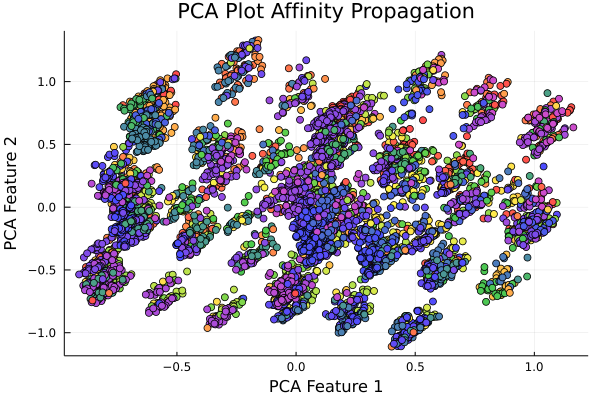

In [31]:
scatter(df_pca_label.x1, df_pca_label.x2, marker_z=result_ap.assignments, title = "PCA Plot Affinity Propagation", color=:lightrainbow, legend=false)
xlabel!("PCA Feature 1")
ylabel!("PCA Feature 2")

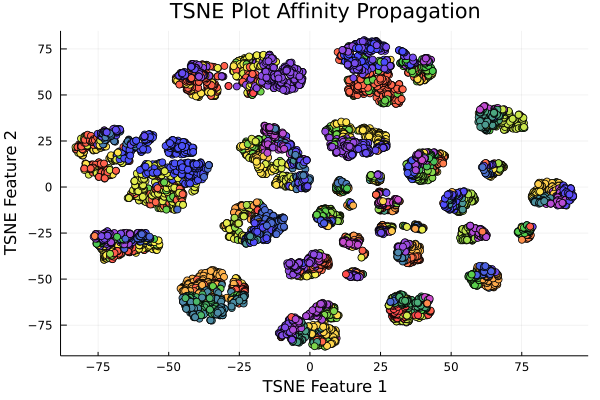

In [32]:
scatter(df_tsne_label.x1, df_tsne_label.x2, marker_z=result_ap.assignments, title = "TSNE Plot Affinity Propagation", color=:lightrainbow, legend=false)
xlabel!("TSNE Feature 1")
ylabel!("TSNE Feature 2")

In [33]:
println("Time: ", ap_time, "s");

Time: 32.4902672s


In [34]:
a = assignments(result_ap);
c = counts(result_ap);
println("Converged: ", result_ap.converged);

Converged: true


In [35]:
distances = pairwise(SqEuclidean(), X_label');
println("Mean Silhouettes Score (Closer to 1 is better): ", mean(silhouettes(a, c, distances)));

Mean Silhouettes Score (Closer to 1 is better): 0.05264041670252232


In [36]:
sils = silhouettes(a, c, distances)
out_3_vals_ap = sort(sils)[[1,2,3]];
out_3_ind_ap = [];
for i = 1:1:3
    temp = findall(x->x==out_3_vals_ap[i], sils)
    append!(out_3_ind_ap, temp);
end
println("The top three outliers are rows: ", out_3_ind_ap[1]," ",out_3_ind_ap[2]," ",out_3_ind_ap[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_ap][1]," ",a[out_3_ind_ap][1], " ",a[out_3_ind_ap][3],  " respectively");

The top three outliers are rows: 8450 258 267 in the excel file
They are part of clusters: 90 90 9 respectively


In [37]:
println("The outlier data in their respective order") 
show(df_label[out_3_ind_ap, :])
println() 

The outlier data in their respective order
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   63.4654  1.64172      6      7         5        1          6          ⋯
   2 │   55.2136  1.42902      6      7         8        0          2
   3 │   55.6208  1.44937      3      6         8        1          0
                                                              20 columns omitted


## DBSCAN

In [38]:
R = pairwise(SqEuclidean(),X_label, dims=1);
features = collect(Matrix(R)');

dbs_time = @elapsed begin
result_db = dbscan(features, 1, 5);
end;

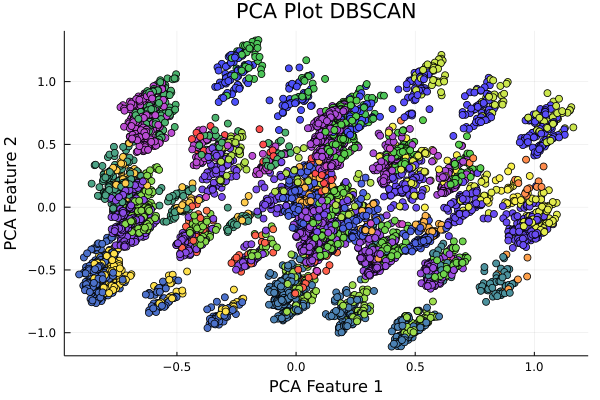

In [39]:
scatter(df_pca_label.x1, df_pca_label.x2, marker_z=result_db.assignments, title = "PCA Plot DBSCAN", color=:lightrainbow, legend=false)
xlabel!("PCA Feature 1")
ylabel!("PCA Feature 2")

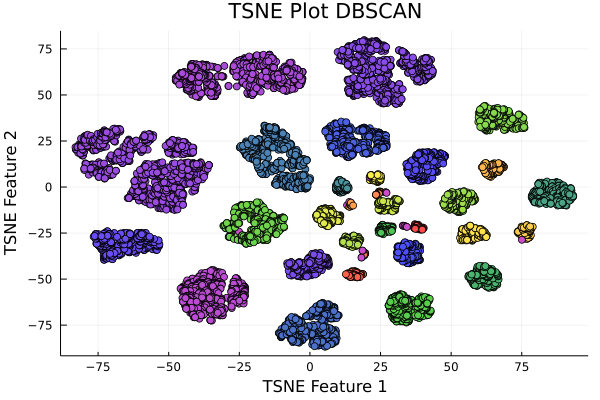

In [40]:
scatter(df_tsne_label.x1, df_tsne_label.x2, marker_z=result_db.assignments, title = "TSNE Plot DBSCAN", color=:lightrainbow, legend=false)
xlabel!("TSNE Feature 1")
ylabel!("TSNE Feature 2")

In [41]:
println("Time: ", dbs_time, "s");

Time: 0.1073548s


In [42]:
a = assignments(result_db);
c = counts(result_db);

In [43]:
prepend!(c, size(findall(x->x==0, a))[1]);

In [44]:
a = a.+1;

In [45]:
println("Amount of Clusters: ", size(c)[1]);

Amount of Clusters: 32


In [46]:
distances = pairwise(SqEuclidean(), X_label');
println("Mean Silhouettes Score (Closer to 1 is better): ", mean(silhouettes(a, c, distances)));

Mean Silhouettes Score (Closer to 1 is better): 0.36431648573469705


In [47]:
sils = silhouettes(a, c, distances)
out_3_vals_db = sort(sils)[[1,2,3]];
out_3_ind_db = [];
for i = 1:1:3
    temp = findall(x->x==out_3_vals_db[i], sils)
    append!(out_3_ind_db, temp);
end
println("The top three outliers are rows: ", out_3_ind_db[1]," ",out_3_ind_db[2]," ",out_3_ind_db[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_db][1]," ",a[out_3_ind_db][1], " ",a[out_3_ind_db][3],  " respectively");

The top three outliers are rows: 3717 3072 3230 in the excel file
They are part of clusters: 1 1 1 respectively


In [48]:
println("The outlier data in their respective order") 
show(df_label[out_3_ind_db, :])
println() 

The outlier data in their respective order
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   92.6067  1.7559       9      7         6        5          6          ⋯
   2 │   70.9367  1.69092      7      3         5        0          9
   3 │   53.7863  1.64849      7      6         5        6          1
                                                              20 columns omitted


## GMM

In [49]:
gmm_time = @elapsed begin
gmm_model = GMM(4,27);
em!(gmm_model, X_label; nIter = 100, varfloor=1e-3);
end;

In [50]:
println("Time: ", gmm_time, "s");

Time: 3.284893701s


In [51]:
gmm_score = avll(gmm_model, X_label);

In [52]:
println("Average Log Likelihood GMM: ", gmm_score);

Average Log Likelihood GMM: 0.27173994020544917


In [53]:
means(gmm_model)

4×27 Array{Float64,2}:
 0.608638  0.754287  0.608146  0.636872  …  0.207377  0.507549  0.625985
 0.608638  0.754287  0.608146  0.636872     0.207377  0.507549  0.625985
 0.608638  0.754287  0.608146  0.636872     0.207377  0.507549  0.625985
 0.608638  0.754287  0.608146  0.636872     0.207377  0.507549  0.625985

# Report

## Plots

To plot the data in some sensible way I performed two forms of dimensionality reduction on the data set to determine the two most important components that I would use for my X and Y. This takes the dimensionality from 27 down to 2 to help with comprehension of the data and graphing.

**PCA:**
PCA seemed to help a bit with seperating the clussters, but there is still a large amount of overlap and points spread around the plot.

**TSNE:**
TSNE seemed to do a better job at seperating the clsuers. Each cluster has a somewhat defiend range and you can see some outliers that reside in other clusters.

## Interpretation

All the plots are reduced from 27 dimensions down to two which greatly limits the explained varience of the data making interpreation difficult. All interpretation is going to be based off the plots and the reduced matrix of the data for easier understanding. 

## K-means
1. The parameters for K-means are simply the data and how many clusters to produce. I chose five clusters by experimenting with what value increased the silhouette score the most by using a for loop to iterate through the parameters.
2. The highest average score I could reliably get with K-means was a silhouette score of ~0.28.
3. The time it takes to run K_means is ~0.010s.
4. K-means plotted decently well with TSNE dimensionality reduction. Distinct groups can be seen and although there is overlap and outliers in some of the clusters, the seperation can be clearly seen.
5. The outliers were found by finding the top three lowest silhouette scores, finding the index of those scores, and then relating them to their corresponding rows in the original data.


In [54]:
println("The top three outliers are rows: ", out_3_ind_kmeans[1]," ",out_3_ind_kmeans[2]," ",out_3_ind_kmeans[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_kmeans][1]," ",a[out_3_ind_kmeans][1], " ",a[out_3_ind_kmeans][3],  " respectively");
println()
println("The outlier data in the corresponding rows") 
show(df_label[out_3_ind_kmeans, :])
println()

The top three outliers are rows: 3040 6410 4543 in the excel file
They are part of clusters: 7 7 7 respectively

The outlier data in the corresponding rows
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   64.0985  1.54962      6      6         4        3          0          ⋯
   2 │   52.8627  1.60821      5      7         6        2          3
   3 │   57.0972  1.57217      4      6         4        2          0
                                                              20 columns omitted


## K-medoids
1. The parameters for K-medoids is the distance matrix of the original data and how many clusters to produce. I used the squared eculidean distance for my distance formula and I chose five clusters. I arrived at these parmeters by once again experimenting with what value increased the silhouette score the most by using a for loop to iterate through the parameters.
2. The highest average score I could reliably get with K-medoids was a silhouette score of ~0.25.
3. The time it takes to run K_medoids is ~0.650s.
4. K-medoids plotted similarly to K-means with TSNE dimensionality reduction. Distinct groups can again be seen though the overlap and outliers. K-medoids has a bit more overlap than K-means, and this is proven with a lower mean silhouette score showing that the algorithm performed worse overall.
5. The outliers were found by finding the top three lowest silhouette scores, finding the index of those scores, and then relating them to their corresponding rows in the original data.

In [55]:
println("The top three outliers are rows: ", out_3_ind_kmedoids[1]," ",out_3_ind_kmedoids[2]," ",out_3_ind_kmedoids[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_kmedoids][1]," ",a[out_3_ind_kmedoids][1], " ",a[out_3_ind_kmedoids][3],  " respectively");
println()
println("The outlier data in the corresponding rows") 
show(df_label[out_3_ind_kmedoids, :])
println()

The top three outliers are rows: 1125 4747 4256 in the excel file
They are part of clusters: 12 12 12 respectively

The outlier data in the corresponding rows
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   66.5404  1.50004      5      5         6        5          9          ⋯
   2 │   69.775   1.55316      7      5         5        6          3
   3 │   58.4484  1.42265      6      6         6        9          5
                                                              20 columns omitted


## Affinity Propagation
1. The parameters for Affinity Propagation is just the distance matrix of the original data where I used the squared euclidean distance to calculate.
2. The highest average score I could reliably get with Affinity Propagation was a silhouette score of ~0.08
3. The time it takes to run Affinity Propagation is ~33.5s
4. Affinity Propagation plotted poorly with both TSNE and PCA dimensionality reduction. There is significant overlap in all the clusters, and although seperation can be seen, the amount of poorly assigned points is high. This is representative of a really low silhouette score. Affinity Propagation happened to score the worst out of all the algorithms.
5. The outliers were found by finding the top three lowest silhouette scores, finding the index of those scores, and then relating them to their corresponding rows in the original data.

In [56]:
println("The top three outliers are rows: ", out_3_ind_ap[1]," ",out_3_ind_ap[2]," ",out_3_ind_ap[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_ap][1]," ",a[out_3_ind_ap][1], " ",a[out_3_ind_ap][3],  " respectively");
println()
println("The outlier data in the corresponding rows") 
show(df_label[out_3_ind_ap, :])
println()

The top three outliers are rows: 8450 258 267 in the excel file
They are part of clusters: 25 25 26 respectively

The outlier data in the corresponding rows
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   63.4654  1.64172      6      7         5        1          6          ⋯
   2 │   55.2136  1.42902      6      7         8        0          2
   3 │   55.6208  1.44937      3      6         8        1          0
                                                              20 columns omitted


## DBSCAN

Extra information: The dbscan function has an assignment error that allows a cluster 0 which conflicts with how the counts works. To solve this issue I found the total number of assignments in cluster 0, prepended that number to counts, and then incremented all assignments by 1. This makes it so the first cluster is cluster 1.

1. The parameters for DBSCAN is the distance matrix of the original data, radius of a point neighborhood, and the minimum number of neighboring points to qualify a point as a density point. I used a for loop to alter the parameters and selected the ones that yielded the highest silhouette score.
2. The highest average score I could reliably get with DBSCAN was a silhouette score of ~0.36
3. The time it takes to run DBSCAN is ~0.070
4. DBSCAN plotted the best with both TSNE and PCA dimensionality reduction. There is decent seperation of the clusters without the last amount of overlap and poor assignments in comparison to the other algoritms. DBSCAN also happened to score the highest silhouette score which would make sense given the plot and how well it performed compared to the others. 
5. The outliers were found by finding the top three lowest silhouette scores, finding the index of those scores, and then relating them to their corresponding rows in the original data.

In [57]:
println("The top three outliers are rows: ", out_3_ind_db[1]," ",out_3_ind_db[2]," ",out_3_ind_db[3], " in the excel file")
println("They are part of clusters: ", a[out_3_ind_db][1]," ",a[out_3_ind_db][1], " ",a[out_3_ind_db][3],  " respectively");
println()
println("The outlier data in the corresponding rows") 
show(df_label[out_3_ind_db, :])
println()

The top three outliers are rows: 3717 3072 3230 in the excel file
They are part of clusters: 1 1 1 respectively

The outlier data in the corresponding rows
3×27 DataFrame
 Row │ tumorsize  co2      pain   wound  mobility  ntumors  nmorphine  remissi ⋯
     │ Float64    Float64  Int64  Int64  Int64     Int64    Int64      Int64   ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │   92.6067  1.7559       9      7         6        5          6          ⋯
   2 │   70.9367  1.69092      7      3         5        0          9
   3 │   53.7863  1.64849      7      6         5        6          1
                                                              20 columns omitted


## GMM
1. The parameters for K-means are simply the data and how many clusters to produce. I chose five clusters by experimenting with what value increased the silhouette score the most.
2. The highest score I could get with GMM was a avergae log likelihood score of ~0.27
3. The time it takes to run K_means is ~0.070

4. I couldn't really find any interpretation of the GMM data due to the fact I could not plot it and a lack understanding of the documentation on how to manipulate the data.
5. Similarly with question 4; I couldn't find any outliers because I don't know how to manipulate or change the data the GMM model outputs.